In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tqdm
import os
import sys
import gc
import numpy as np
from utils import read_parquet_dataset_from_local
from joblib import dump

In [120]:
# if the plots look bad, run it again
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [3]:
TRAIN_TRANSACTIONS_PATH = '../train_transactions_contest/'
TEST_TRANSACTIONS_PATH = '../test_transactions_contest/'
TRAIN_TARGET_PATH = '../train_target.csv'
TEST_TARGET_PATH = '../test_target_contest.csv'

In [4]:
from features import extract_basic_aggregations

def prepare_transactions_dataset(path_to_dataset: str,
                                 num_parts_to_preprocess_at_once: int=1,
                                 num_parts_total: int=50, 
                                 save_to_path=None,
                                 verbose: bool=False):
    """
    Creates pd.DataFrame with an extracted features from card transaction histories
    
    path_to_dataset: str  
        path to the transaction dataset directory
    num_parts_to_preprocess_at_once: int 
        number of partitions to load and process at once
    num_parts_total: int 
        total number of partitions to process, defaul is all (50)
    save_to_path: str
        directory to save processed data, if None then skip
    verbose: bool
        print info about each processing chunk of data
    """
    preprocessed_frames = []
    block = 0
    for step in tqdm.tqdm_notebook(range(0, num_parts_total, num_parts_to_preprocess_at_once), 
                                   desc="Transforming transactions data"):
        transactions_frame = read_parquet_dataset_from_local(path_to_dataset, step, num_parts_to_preprocess_at_once, 
                                                             verbose=verbose)
        features = extract_basic_aggregations(transactions_frame, 
                                              cat_columns=['mcc_category', 'day_of_week', 'operation_type'])
        if save_to_path:
            block_as_str = str(block)
            if len(block_as_str) == 1:
                block_as_str = '00' + block_as_str
            else:
                block_as_str = '0' + block_as_str
            features.to_parquet(os.path.join(save_to_path, f'processed_chunk_{block_as_str}.parquet'))
            
        preprocessed_frames.append(features)
    return pd.concat(preprocessed_frames, axis=0, ignore_index=True)

In [5]:
data = prepare_transactions_dataset(TRAIN_TRANSACTIONS_PATH, num_parts_to_preprocess_at_once=5, num_parts_total=50)

/tmp/ipykernel_37339/610645134.py:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm.tqdm_notebook(range(0, num_parts_total, num_parts_to_preprocess_at_once),


Transforming transactions data:   0%|          | 0/10 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

In [6]:
test_data = prepare_transactions_dataset(TEST_TRANSACTIONS_PATH, num_parts_to_preprocess_at_once=5, num_parts_total=50)

/tmp/ipykernel_37339/610645134.py:24: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm.tqdm_notebook(range(0, num_parts_total, num_parts_to_preprocess_at_once),


Transforming transactions data:   0%|          | 0/10 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

Reading dataset with pandas:   0%|          | 0/5 [00:00<?, ?it/s]

In [7]:
data

,app_id,amnt_count_mcc_category_1,amnt_count_mcc_category_2,amnt_count_mcc_category_3,amnt_count_mcc_category_4,amnt_count_mcc_category_5,amnt_count_mcc_category_6,amnt_count_mcc_category_7,amnt_count_mcc_category_8,amnt_count_mcc_category_9,...,amnt_sum,amnt_std,hour_diff_max,hour_diff_mean,hour_diff_median,hour_diff_var,hour_diff_std,days_before_min,days_before_max,days_before_median
0,0,38,109,1,1,0,0,11,4,6,...,69.982750,0.094032,555,44.613260,20.0,5505.749601,74.200739,14,351,140.0
1,1,82,98,21,25,22,7,20,0,4,...,119.384781,0.078044,517,24.053371,14.0,2624.771791,51.232527,1,358,177.0
2,2,87,66,2,1,15,4,0,3,0,...,70.098404,0.087890,875,36.655022,13.0,7120.183100,84.381177,2,351,198.0
3,3,12,17,20,6,1,1,6,0,0,...,22.164129,0.098987,1446,109.104478,4.0,81713.761646,285.856190,20,325,144.0
4,4,5,86,0,0,0,0,0,1,0,...,48.239197,0.128579,360,71.837607,35.0,8030.413056,89.612572,1,351,212.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963806,1003045,4,20,0,0,0,0,0,28,0,...,24.824673,0.076019,843,146.400000,25.0,57078.244444,238.910536,8,344,219.0
963807,1003047,43,0,103,14,4,16,15,32,12,...,114.512894,0.099036,370,32.896154,5.0,3399.730487,58.307208,2,359,183.0
963808,1003048,38,45,15,15,29,23,8,10,12,...,92.138306,0.103740,1245,39.246575,7.0,14031.149931,118.453155,1,359,92.0
963809,1003049,33,27,25,1,3,4,9,0,2,...,36.717648,0.090648,702,71.165138,3.0,20865.602107,144.449306,29,352,194.0


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 963811 entries, 0 to 963810
Columns: 186 entries, app_id to days_before_median
dtypes: float32(117), float64(6), int32(3), int64(60)
memory usage: 926.5 MB


In [9]:
test_data.head()

,app_id,amnt_count_mcc_category_1,amnt_count_mcc_category_2,amnt_count_mcc_category_3,amnt_count_mcc_category_4,amnt_count_mcc_category_5,amnt_count_mcc_category_6,amnt_count_mcc_category_7,amnt_count_mcc_category_8,amnt_count_mcc_category_9,...,amnt_sum,amnt_std,hour_diff_max,hour_diff_mean,hour_diff_median,hour_diff_var,hour_diff_std,days_before_min,days_before_max,days_before_median
0,1063620,67,87,224,79,12,72,20,14,44,...,223.663757,0.143467,238,12.716196,4.0,558.742252,23.637729,1,359,108.0
1,1063621,78,37,1,1,6,32,6,46,3,...,70.934822,0.134166,695,37.945205,13.0,6849.685057,82.762824,7,353,130.0
2,1063622,394,70,128,25,36,176,23,3,15,...,257.317688,0.069607,289,9.538547,0.0,855.219709,29.244140,1,359,136.0
3,1063623,231,143,54,39,3,18,32,30,17,...,248.650116,0.076571,202,13.538095,5.0,581.037497,24.104719,1,357,201.5
4,1063624,31,55,1,17,1,0,8,0,2,...,45.384167,0.101596,501,65.173228,7.0,12905.033246,113.600322,14,359,227.0


In [10]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502716 entries, 0 to 502715
Columns: 186 entries, app_id to days_before_median
dtypes: float32(117), float64(6), int32(3), int64(60)
memory usage: 483.3 MB


Let's check for any NaN values

In [11]:
data.isna().any().any()

False

In [12]:
test_data.isna().any().any()

False

Let's check for any non-informative columns having only one unique value

In [13]:
nunique_data = data.nunique()

In [14]:
nunique_data[nunique_data == 1]

amnt_mean_operation_type_20    1
amnt_sum_operation_type_20     1
dtype: int64

In [15]:
nunique_test_data = test_data.nunique()

In [16]:
nunique_test_data[nunique_test_data == 1]

amnt_mean_operation_type_20    1
amnt_sum_operation_type_20     1
dtype: int64

OK we are safe to remove these two columns from both train and test datasets

In [17]:
data = data.loc[:, nunique_data != 1]
test_data = test_data.loc[:, nunique_test_data != 1]

In [18]:
(data.nunique() == 1).any(), (test_data.nunique() == 1).any()

(False, False)

In [19]:
train_target = pd.read_csv(TRAIN_TARGET_PATH)

In [20]:
train_target

,app_id,product,flag
0,0,3,0
1,1,1,0
2,2,1,0
3,3,1,0
4,4,1,0
...,...,...,...
963806,1003045,1,0
963807,1003047,0,0
963808,1003048,1,0
963809,1003049,0,0


In [21]:
test_target = pd.read_csv(TEST_TARGET_PATH)

In [22]:
test_target.head()

,app_id,product
0,1063620,0
1,1063621,0
2,1063622,1
3,1063623,1
4,1063624,2


We need to merge two dataframes because product is a feature

In [23]:
data = pd.merge(data, train_target, on='app_id', validate='one_to_one')

In [24]:
test_data = pd.merge(test_data, test_target, on='app_id', validate='one_to_one')

In [25]:
data

,app_id,amnt_count_mcc_category_1,amnt_count_mcc_category_2,amnt_count_mcc_category_3,amnt_count_mcc_category_4,amnt_count_mcc_category_5,amnt_count_mcc_category_6,amnt_count_mcc_category_7,amnt_count_mcc_category_8,amnt_count_mcc_category_9,...,hour_diff_max,hour_diff_mean,hour_diff_median,hour_diff_var,hour_diff_std,days_before_min,days_before_max,days_before_median,product,flag
0,0,38,109,1,1,0,0,11,4,6,...,555,44.613260,20.0,5505.749601,74.200739,14,351,140.0,3,0
1,1,82,98,21,25,22,7,20,0,4,...,517,24.053371,14.0,2624.771791,51.232527,1,358,177.0,1,0
2,2,87,66,2,1,15,4,0,3,0,...,875,36.655022,13.0,7120.183100,84.381177,2,351,198.0,1,0
3,3,12,17,20,6,1,1,6,0,0,...,1446,109.104478,4.0,81713.761646,285.856190,20,325,144.0,1,0
4,4,5,86,0,0,0,0,0,1,0,...,360,71.837607,35.0,8030.413056,89.612572,1,351,212.0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
963806,1003045,4,20,0,0,0,0,0,28,0,...,843,146.400000,25.0,57078.244444,238.910536,8,344,219.0,1,0
963807,1003047,43,0,103,14,4,16,15,32,12,...,370,32.896154,5.0,3399.730487,58.307208,2,359,183.0,0,0
963808,1003048,38,45,15,15,29,23,8,10,12,...,1245,39.246575,7.0,14031.149931,118.453155,1,359,92.0,1,0
963809,1003049,33,27,25,1,3,4,9,0,2,...,702,71.165138,3.0,20865.602107,144.449306,29,352,194.0,0,0


In [26]:
test_data

,app_id,amnt_count_mcc_category_1,amnt_count_mcc_category_2,amnt_count_mcc_category_3,amnt_count_mcc_category_4,amnt_count_mcc_category_5,amnt_count_mcc_category_6,amnt_count_mcc_category_7,amnt_count_mcc_category_8,amnt_count_mcc_category_9,...,amnt_std,hour_diff_max,hour_diff_mean,hour_diff_median,hour_diff_var,hour_diff_std,days_before_min,days_before_max,days_before_median,product
0,1063620,67,87,224,79,12,72,20,14,44,...,0.143467,238,12.716196,4.0,558.742252,23.637729,1,359,108.0,0
1,1063621,78,37,1,1,6,32,6,46,3,...,0.134166,695,37.945205,13.0,6849.685057,82.762824,7,353,130.0,0
2,1063622,394,70,128,25,36,176,23,3,15,...,0.069607,289,9.538547,0.0,855.219709,29.244140,1,359,136.0,1
3,1063623,231,143,54,39,3,18,32,30,17,...,0.076571,202,13.538095,5.0,581.037497,24.104719,1,357,201.5,1
4,1063624,31,55,1,17,1,0,8,0,2,...,0.101596,501,65.173228,7.0,12905.033246,113.600322,14,359,227.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
502711,1580438,99,51,36,70,25,22,22,6,13,...,0.091406,412,19.376417,4.0,1680.289806,40.991338,1,357,215.0,3
502712,1580439,188,125,493,387,13,53,61,6,30,...,0.115851,141,5.506101,3.0,84.517476,9.193339,1,359,188.0,1
502713,1580440,0,105,0,0,0,0,0,0,0,...,0.231980,361,77.104762,31.0,10035.075458,100.175224,17,354,167.0,0
502714,1580441,29,25,23,11,20,1,2,0,0,...,0.096843,42,7.639344,3.0,89.323398,9.451106,1,40,20.0,0


At this moment we cannot submit test predictions so we need to create our own test dataset

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
train_data, inner_test_data = train_test_split(data.copy(),
                                               test_size=0.1,
                                               random_state=42,
                                               stratify=data['flag'].values)

This is our metric

In [29]:
from sklearn.metrics import roc_auc_score

In [30]:
cv_scores = {}
nfolds = 5

In [31]:
from sklearn.model_selection import cross_val_score

Baseline dummy model using prior probabilities for each product class

In [32]:
from sklearn.base import BaseEstimator, ClassifierMixin

In [33]:
class DummyProductClassifier(BaseEstimator, ClassifierMixin):
    
    def __init__(self):
        self.classes_ = [0, 1]
        pass

    def fit(self, X, y):
        d = pd.concat([X['product'], y], axis=1)
        self.product_probas = d.groupby('product')['flag'].mean()

    def predict_proba(self, X):
        flag1_proba = self.product_probas[X['product']].to_numpy().reshape(-1, 1)
        return np.concatenate((1 - flag1_proba, flag1_proba), axis=1)

    def decision_function(self, X):
        return self.predict_proba(X)[:, 1]

    def predict(self, X):
        return np.round(self.predict_proba(X)[:, 1])

In [34]:
dummy_product_clf = DummyProductClassifier()

In [35]:
cv_scores['dummy_product_clf'] = cross_val_score(dummy_product_clf,
                                                 X=train_data[['product']],
                                                 y=train_data['flag'],
                                                 scoring='roc_auc',
                                                 cv=nfolds).mean()

In [36]:
cv_scores

{'dummy_product_clf': 0.5813561001538274}

In [37]:
dummy_product_clf.fit(train_data[['product']], train_data['flag'])

dummy model which gives 0 default probability

In [38]:
from sklearn.dummy import DummyClassifier

In [39]:
baseline_zero_proba_clf = DummyClassifier(strategy='constant', constant=0)

In [40]:
cv_scores['baseline_zero_proba_clf'] = cross_val_score(baseline_zero_proba_clf,
                                                         X=train_data[['product']],
                                                         y=train_data['flag'],
                                                         scoring='roc_auc',
                                                         cv=nfolds).mean()

In [41]:
baseline_zero_proba_clf.fit(train_data[['product']], train_data['flag'])

DummyClassifier(constant=0, strategy='constant')

In [42]:
cv_scores

{'dummy_product_clf': 0.5813561001538274, 'baseline_zero_proba_clf': 0.5}

dummy model which gives 0.5 default probability

In [43]:
baseline_05_proba_clf = DummyClassifier(strategy='uniform')

In [44]:
cv_scores['baseline_05_proba_clf'] = cross_val_score(baseline_05_proba_clf,
                                                         X=train_data[['product']],
                                                         y=train_data['flag'],
                                                         scoring='roc_auc',
                                                         cv=nfolds).mean()

In [45]:
baseline_05_proba_clf.fit(train_data[['product']], train_data['flag'])

DummyClassifier(strategy='uniform')

In [46]:
cv_scores

{'dummy_product_clf': 0.5813561001538274,
 'baseline_zero_proba_clf': 0.5,
 'baseline_05_proba_clf': 0.5}

Let's do a bit more EDA

In [47]:
features = train_data.columns.difference(['app_id', 'flag'])

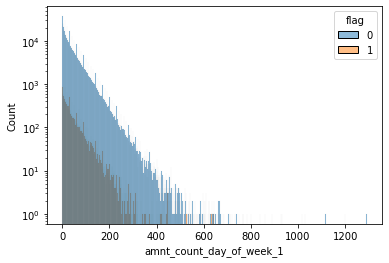

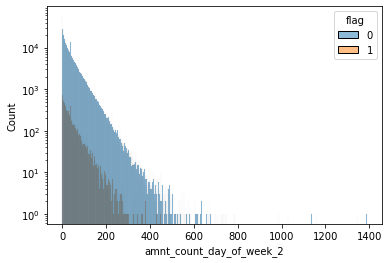

In [48]:
for feature in features[:2]:
    g = sns.histplot(data=train_data, x=feature, hue='flag')
    g.set_yscale('log')
    plt.show()

Let's analyze correlations between features

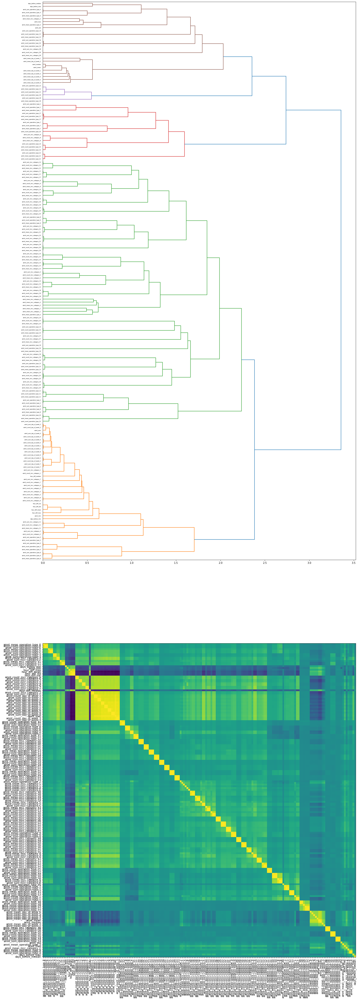

In [112]:
from scipy.stats import spearmanr
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 60))
corr = spearmanr(train_data[features.drop(['product'])]).correlation

# Ensure the correlation matrix is symmetric
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)

# We convert the correlation matrix to a distance matrix before performing
# hierarchical clustering using Ward's linkage.
distance_matrix = 1 - np.abs(corr)
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=features.drop(['product']).to_list(), ax=ax1, orientation='right'
)
dendro_idx = np.arange(0, len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])
fig.tight_layout()
plt.show()

In [116]:
check_ft = ['amnt_median', 'amnt_mean', 'amnt_mean_day_of_week_1', 'amnt_mean_day_of_week_3']
check_ft = ['amnt_mean_operation_type_6', 'amnt_count_operation_type_6', 'amnt_sum_operation_type_6']
train_data[check_ft].corr()

,amnt_mean_operation_type_6,amnt_count_operation_type_6,amnt_sum_operation_type_6
amnt_mean_operation_type_6,1.000000,0.340032,0.354144
amnt_count_operation_type_6,0.340032,1.000000,0.989200
amnt_sum_operation_type_6,0.354144,0.989200,1.000000


In [49]:
from sklearn.pipeline import make_pipeline

In [50]:
from sklearn.decomposition import PCA

In [51]:
from sklearn.preprocessing import StandardScaler

In [52]:
pca = make_pipeline(StandardScaler(), PCA(n_components=0.9))

we need to remove the only categorical feature we have first

In [53]:
pca_features = pca.fit_transform(train_data[features.drop('product')])

In [54]:
pca['pca'].explained_variance_ratio_

array([0.20482197, 0.0375145 , 0.03225751, 0.02963393, 0.02459937,
       0.02115522, 0.01974008, 0.01715771, 0.01621329, 0.01585685,
       0.01451088, 0.01411635, 0.01369307, 0.01339065, 0.01306545,
       0.01246056, 0.01202532, 0.01142893, 0.01118259, 0.01109027,
       0.01096879, 0.01092492, 0.01064049, 0.01026258, 0.01013681,
       0.00994927, 0.00977011, 0.00951456, 0.00935666, 0.00918061,
       0.00885737, 0.00862754, 0.00840323, 0.00815192, 0.00808906,
       0.0079393 , 0.00774216, 0.00756847, 0.00727657, 0.00701516,
       0.00693053, 0.00663175, 0.00626653, 0.00596666, 0.00587561,
       0.00557595, 0.0055462 , 0.00541938, 0.00523417, 0.00516358,
       0.00497073, 0.00491722, 0.004811  , 0.00468252, 0.00460657,
       0.00456608, 0.00445001, 0.0043654 , 0.00430604, 0.00424253,
       0.00417742, 0.00413731, 0.00411775, 0.00401696, 0.00390118,
       0.00383192, 0.00378454, 0.00375735, 0.00372465, 0.00369014,
       0.00363608, 0.0035682 , 0.00351333, 0.00349122, 0.00348

In [55]:
pca['pca'].explained_variance_ratio_.sum()

0.9012245121534193

In [56]:
pca['pca'].n_features_

183

In [57]:
len(pca['pca'].explained_variance_ratio_)

79

We managed to reduce number of features in more than two times

In [58]:
from sklearn.linear_model import LogisticRegression

In [59]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

In [60]:
cat_features = ['product']
num_features = features.drop('product').to_list()

In [61]:
pca_log_reg = make_pipeline(ColumnTransformer(transformers=
                                              [("num", make_pipeline(StandardScaler(), PCA(n_components=80)), num_features),
                                               ("cat", OneHotEncoder(handle_unknown='ignore'), cat_features)
                                              ]),
                            LogisticRegression())

In [62]:
cv_scores['pca_log_reg'] = cross_val_score(pca_log_reg,
                                             X=train_data[features],
                                             y=train_data['flag'],
                                             scoring='roc_auc',
                                             cv=nfolds).mean()

In [63]:
pca_log_reg.fit(train_data[features], train_data['flag'])

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('standardscaler',
                                                                   StandardScaler()),
                                                                  ('pca',
                                                                   PCA(n_components=80))]),
                                                  ['amnt_count_day_of_week_1',
                                                   'amnt_count_day_of_week_2',
                                                   'amnt_count_day_of_week_3',
                                                   'amnt_count_day_of_week_4',
                                                   'amnt_count_day_of_week_5',
                                                   'amnt_count_day_of_week_6',
                                                   'amnt_count_day_of_week_7',
               

In [64]:
cv_scores

{'dummy_product_clf': 0.5813561001538274,
 'baseline_zero_proba_clf': 0.5,
 'baseline_05_proba_clf': 0.5,
 'pca_log_reg': 0.7304609465897057}

In [65]:
from xgboost import XGBClassifier

for xgboost classifier we need additional validation set for stop criteria

In [66]:
train_xgb_data, val_xgb_data = train_test_split(train_data.copy(),
                                                test_size=0.1,
                                                random_state=42,
                                                stratify=train_data['flag'].values)

In [67]:
# WARNING: CPU training is much slower than GPU!
XGB_CPU_TRAIN = False
if XGB_CPU_TRAIN:
    xgb_method_param = {'tree_method': 'auto'}
else:
    xgb_method_param = {'tree_method': 'gpu_hist'}

In [68]:
xgb_clf = XGBClassifier(max_depth=2, **xgb_method_param)

In [69]:
xgb_clf.fit(train_xgb_data[features], train_xgb_data['flag'])

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=0, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=2, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [70]:
roc_auc_score(y_true=val_xgb_data['flag'], y_score=xgb_clf.predict_proba(val_xgb_data[features])[:, 1])

0.7605100476195403

We can find better parameters

In [71]:
from sklearn.model_selection import GridSearchCV

In [72]:
n_splits = 5

In [73]:
gs_xgb = GridSearchCV(estimator=XGBClassifier(early_stopping_rounds=10,
                                              **xgb_method_param,
                                              n_estimators=100,
                                              random_seed=42,
                                              eval_metric='auc'),
                      param_grid={"max_depth": [2, 8, 16],
                                  'learning_rate': [0.01, 0.1, 1]},
                      scoring='roc_auc',
                      cv=n_splits)

gs_xgb.fit(X=train_xgb_data[features],
           y=train_xgb_data['flag'],
           eval_set=[(val_xgb_data[features],
                      val_xgb_data['flag'])])

[22:15:11] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.60457
[1]	validation_0-auc:0.60543
[2]	validation_0-auc:0.63414
[3]	validation_0-auc:0.64011
[4]	validation_0-auc:0.63922
[5]	validation_0-auc:0.64011
[6]	validation_0-auc:0.64020
[7]	validation_0-auc:0.64005
[8]	validation_0-auc:0.64012
[9]	validation_0-auc:0.64002
[10]	validation_0-auc:0.64029
[11]	validation_0-auc:0.64023
[12]	validation_0-auc:0.64991
[13]	validation_0-auc:0.64902
[14]	validation_0-auc:0.64966
[15]	validation_0-auc:0.64873
[16]	validation_0-auc:0.65044
[17]	validation_0-auc:0.65160
[18]	validation_0-auc:0.65046
[19]	validation_0-auc:0.65201
[20]	validation_0-auc:0.65064
[21]	validation_0-

[55]	validation_0-auc:0.66508
[56]	validation_0-auc:0.66508
[57]	validation_0-auc:0.66514
[58]	validation_0-auc:0.66521
[59]	validation_0-auc:0.66520
[60]	validation_0-auc:0.66509
[61]	validation_0-auc:0.66516
[62]	validation_0-auc:0.66536
[63]	validation_0-auc:0.66540
[64]	validation_0-auc:0.66529
[65]	validation_0-auc:0.66521
[66]	validation_0-auc:0.66534
[67]	validation_0-auc:0.66608
[68]	validation_0-auc:0.66605
[69]	validation_0-auc:0.66588
[70]	validation_0-auc:0.66610
[71]	validation_0-auc:0.66623
[72]	validation_0-auc:0.66623
[73]	validation_0-auc:0.66616
[74]	validation_0-auc:0.66623
[75]	validation_0-auc:0.66635
[76]	validation_0-auc:0.66628
[77]	validation_0-auc:0.66631
[78]	validation_0-auc:0.66611
[79]	validation_0-auc:0.66656
[80]	validation_0-auc:0.66643
[81]	validation_0-auc:0.66639
[82]	validation_0-auc:0.66647
[83]	validation_0-auc:0.66644
[84]	validation_0-auc:0.66641
[85]	validation_0-auc:0.66656
[86]	validation_0-auc:0.66657
[87]	validation_0-auc:0.66649
[88]	valid

[67]	validation_0-auc:0.73124
[68]	validation_0-auc:0.73132
[69]	validation_0-auc:0.73163
[70]	validation_0-auc:0.73162
[71]	validation_0-auc:0.73191
[72]	validation_0-auc:0.73204
[73]	validation_0-auc:0.73229
[74]	validation_0-auc:0.73227
[75]	validation_0-auc:0.73246
[76]	validation_0-auc:0.73265
[77]	validation_0-auc:0.73273
[78]	validation_0-auc:0.73284
[79]	validation_0-auc:0.73295
[80]	validation_0-auc:0.73318
[81]	validation_0-auc:0.73332
[82]	validation_0-auc:0.73340
[83]	validation_0-auc:0.73359
[84]	validation_0-auc:0.73360
[85]	validation_0-auc:0.73365
[86]	validation_0-auc:0.73364
[87]	validation_0-auc:0.73389
[88]	validation_0-auc:0.73397
[89]	validation_0-auc:0.73410
[90]	validation_0-auc:0.73413
[91]	validation_0-auc:0.73427
[92]	validation_0-auc:0.73428
[93]	validation_0-auc:0.73441
[94]	validation_0-auc:0.73446
[95]	validation_0-auc:0.73456
[96]	validation_0-auc:0.73462
[97]	validation_0-auc:0.73462
[98]	validation_0-auc:0.73482
[99]	validation_0-auc:0.73485
[22:15:25]

[5]	validation_0-auc:0.70954
[6]	validation_0-auc:0.70886
[7]	validation_0-auc:0.71200
[8]	validation_0-auc:0.71366
[9]	validation_0-auc:0.71475
[10]	validation_0-auc:0.71470
[11]	validation_0-auc:0.71755
[12]	validation_0-auc:0.71737
[13]	validation_0-auc:0.71890
[14]	validation_0-auc:0.72013
[15]	validation_0-auc:0.71995
[16]	validation_0-auc:0.72126
[17]	validation_0-auc:0.72138
[18]	validation_0-auc:0.72218
[19]	validation_0-auc:0.72189
[20]	validation_0-auc:0.72322
[21]	validation_0-auc:0.72348
[22]	validation_0-auc:0.72417
[23]	validation_0-auc:0.72453
[24]	validation_0-auc:0.72465
[25]	validation_0-auc:0.72539
[26]	validation_0-auc:0.72601
[27]	validation_0-auc:0.72562
[28]	validation_0-auc:0.72633
[29]	validation_0-auc:0.72675
[30]	validation_0-auc:0.72650
[31]	validation_0-auc:0.72691
[32]	validation_0-auc:0.72781
[33]	validation_0-auc:0.72807
[34]	validation_0-auc:0.72838
[35]	validation_0-auc:0.72864
[36]	validation_0-auc:0.72898
[37]	validation_0-auc:0.72879
[38]	validation

[55]	validation_0-auc:0.73427
[56]	validation_0-auc:0.73456
[57]	validation_0-auc:0.73459
[58]	validation_0-auc:0.73455
[59]	validation_0-auc:0.73478
[60]	validation_0-auc:0.73482
[61]	validation_0-auc:0.73492
[62]	validation_0-auc:0.73546
[63]	validation_0-auc:0.73601
[64]	validation_0-auc:0.73590
[65]	validation_0-auc:0.73594
[66]	validation_0-auc:0.73610
[67]	validation_0-auc:0.73624
[68]	validation_0-auc:0.73603
[69]	validation_0-auc:0.73600
[70]	validation_0-auc:0.73620
[71]	validation_0-auc:0.73622
[72]	validation_0-auc:0.73639
[73]	validation_0-auc:0.73634
[74]	validation_0-auc:0.73634
[75]	validation_0-auc:0.73642
[76]	validation_0-auc:0.73652
[77]	validation_0-auc:0.73667
[78]	validation_0-auc:0.73664
[79]	validation_0-auc:0.73662
[80]	validation_0-auc:0.73685
[81]	validation_0-auc:0.73725
[82]	validation_0-auc:0.73744
[83]	validation_0-auc:0.73764
[84]	validation_0-auc:0.73781
[85]	validation_0-auc:0.73763
[86]	validation_0-auc:0.73787
[87]	validation_0-auc:0.73797
[88]	valid

[0]	validation_0-auc:0.69493
[1]	validation_0-auc:0.69866
[2]	validation_0-auc:0.70075
[3]	validation_0-auc:0.70017
[4]	validation_0-auc:0.70204
[5]	validation_0-auc:0.71270
[6]	validation_0-auc:0.71284
[7]	validation_0-auc:0.71324
[8]	validation_0-auc:0.71604
[9]	validation_0-auc:0.71669
[10]	validation_0-auc:0.71738
[11]	validation_0-auc:0.72015
[12]	validation_0-auc:0.72095
[13]	validation_0-auc:0.72259
[14]	validation_0-auc:0.72275
[15]	validation_0-auc:0.72359
[16]	validation_0-auc:0.72388
[17]	validation_0-auc:0.72404
[18]	validation_0-auc:0.72468
[19]	validation_0-auc:0.72493
[20]	validation_0-auc:0.72567
[21]	validation_0-auc:0.72578
[22]	validation_0-auc:0.72693
[23]	validation_0-auc:0.72750
[24]	validation_0-auc:0.72784
[25]	validation_0-auc:0.72882
[26]	validation_0-auc:0.72876
[27]	validation_0-auc:0.72927
[28]	validation_0-auc:0.72984
[29]	validation_0-auc:0.73027
[30]	validation_0-auc:0.73056
[31]	validation_0-auc:0.73097
[32]	validation_0-auc:0.73113
[33]	validation_0-au

[0]	validation_0-auc:0.61564
[1]	validation_0-auc:0.63060
[2]	validation_0-auc:0.64586
[3]	validation_0-auc:0.65641
[4]	validation_0-auc:0.66076
[5]	validation_0-auc:0.66021
[6]	validation_0-auc:0.66316
[7]	validation_0-auc:0.66503
[8]	validation_0-auc:0.66646
[9]	validation_0-auc:0.66836
[10]	validation_0-auc:0.66757
[11]	validation_0-auc:0.66839
[12]	validation_0-auc:0.67004
[13]	validation_0-auc:0.67095
[14]	validation_0-auc:0.66956
[15]	validation_0-auc:0.67018
[16]	validation_0-auc:0.67118
[17]	validation_0-auc:0.67141
[18]	validation_0-auc:0.67538
[19]	validation_0-auc:0.67566
[20]	validation_0-auc:0.67596
[21]	validation_0-auc:0.67896
[22]	validation_0-auc:0.67939
[23]	validation_0-auc:0.67970
[24]	validation_0-auc:0.68172
[25]	validation_0-auc:0.68236
[26]	validation_0-auc:0.68330
[27]	validation_0-auc:0.68795
[28]	validation_0-auc:0.68921
[29]	validation_0-auc:0.69227
[30]	validation_0-auc:0.69224
[31]	validation_0-auc:0.69225
[32]	validation_0-auc:0.69736
[33]	validation_0-au

[50]	validation_0-auc:0.72717
[51]	validation_0-auc:0.72754
[52]	validation_0-auc:0.72843
[53]	validation_0-auc:0.72872
[54]	validation_0-auc:0.72978
[55]	validation_0-auc:0.73003
[56]	validation_0-auc:0.73006
[57]	validation_0-auc:0.73039
[58]	validation_0-auc:0.73115
[59]	validation_0-auc:0.73193
[60]	validation_0-auc:0.73244
[61]	validation_0-auc:0.73288
[62]	validation_0-auc:0.73368
[63]	validation_0-auc:0.73383
[64]	validation_0-auc:0.73435
[65]	validation_0-auc:0.73517
[66]	validation_0-auc:0.73509
[67]	validation_0-auc:0.73562
[68]	validation_0-auc:0.73579
[69]	validation_0-auc:0.73631
[70]	validation_0-auc:0.73668
[71]	validation_0-auc:0.73685
[72]	validation_0-auc:0.73747
[73]	validation_0-auc:0.73798
[74]	validation_0-auc:0.73861
[75]	validation_0-auc:0.73909
[76]	validation_0-auc:0.73907
[77]	validation_0-auc:0.73937
[78]	validation_0-auc:0.74014
[79]	validation_0-auc:0.74030
[80]	validation_0-auc:0.74056
[81]	validation_0-auc:0.74067
[82]	validation_0-auc:0.74120
[83]	valid

[22:18:50] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.69066
[1]	validation_0-auc:0.70844
[2]	validation_0-auc:0.71699
[3]	validation_0-auc:0.72022
[4]	validation_0-auc:0.72414
[5]	validation_0-auc:0.72674
[6]	validation_0-auc:0.72744
[7]	validation_0-auc:0.72786
[8]	validation_0-auc:0.72950
[9]	validation_0-auc:0.73147
[10]	validation_0-auc:0.73228
[11]	validation_0-auc:0.73413
[12]	validation_0-auc:0.73453
[13]	validation_0-auc:0.73563
[14]	validation_0-auc:0.73557
[15]	validation_0-auc:0.73617
[16]	validation_0-auc:0.73721
[17]	validation_0-auc:0.73875
[18]	validation_0-auc:0.73937
[19]	validation_0-auc:0.74025
[20]	validation_0-auc:0.74108
[21]	validation_0-

[38]	validation_0-auc:0.75178
[39]	validation_0-auc:0.75308
[40]	validation_0-auc:0.75330
[41]	validation_0-auc:0.75411
[42]	validation_0-auc:0.75459
[43]	validation_0-auc:0.75470
[44]	validation_0-auc:0.75531
[45]	validation_0-auc:0.75562
[46]	validation_0-auc:0.75609
[47]	validation_0-auc:0.75657
[48]	validation_0-auc:0.75703
[49]	validation_0-auc:0.75700
[50]	validation_0-auc:0.75736
[51]	validation_0-auc:0.75799
[52]	validation_0-auc:0.75829
[53]	validation_0-auc:0.75868
[54]	validation_0-auc:0.75934
[55]	validation_0-auc:0.76004
[56]	validation_0-auc:0.76011
[57]	validation_0-auc:0.76026
[58]	validation_0-auc:0.76048
[59]	validation_0-auc:0.76117
[60]	validation_0-auc:0.76167
[61]	validation_0-auc:0.76210
[62]	validation_0-auc:0.76246
[63]	validation_0-auc:0.76246
[64]	validation_0-auc:0.76294
[65]	validation_0-auc:0.76309
[66]	validation_0-auc:0.76359
[67]	validation_0-auc:0.76405
[68]	validation_0-auc:0.76412
[69]	validation_0-auc:0.76473
[70]	validation_0-auc:0.76493
[71]	valid

[88]	validation_0-auc:0.76060
[89]	validation_0-auc:0.76035
[90]	validation_0-auc:0.76043
[91]	validation_0-auc:0.76054
[92]	validation_0-auc:0.76052
[22:19:48] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.68838
[1]	validation_0-auc:0.70894
[2]	validation_0-auc:0.71734
[3]	validation_0-auc:0.72298
[4]	validation_0-auc:0.72649
[5]	validation_0-auc:0.72743
[6]	validation_0-auc:0.72857
[7]	validation_0-auc:0.72839
[8]	validation_0-auc:0.72890
[9]	validation_0-auc:0.73062
[10]	validation_0-auc:0.73042
[11]	validation_0-auc:0.72980
[12]	validation_0-auc:0.72922
[13]	validation_0-auc:0.72890
[14]	validation_0-auc:0.72864
[15]	validation_0-auc:0.72877
[16]	validation_0-

[43]	validation_0-auc:0.74617
[44]	validation_0-auc:0.74745
[45]	validation_0-auc:0.74800
[46]	validation_0-auc:0.74873
[47]	validation_0-auc:0.74969
[48]	validation_0-auc:0.75037
[49]	validation_0-auc:0.75075
[50]	validation_0-auc:0.75115
[51]	validation_0-auc:0.75221
[52]	validation_0-auc:0.75213
[53]	validation_0-auc:0.75266
[54]	validation_0-auc:0.75307
[55]	validation_0-auc:0.75338
[56]	validation_0-auc:0.75358
[57]	validation_0-auc:0.75356
[58]	validation_0-auc:0.75378
[59]	validation_0-auc:0.75451
[60]	validation_0-auc:0.75445
[61]	validation_0-auc:0.75478
[62]	validation_0-auc:0.75489
[63]	validation_0-auc:0.75496
[64]	validation_0-auc:0.75504
[65]	validation_0-auc:0.75485
[66]	validation_0-auc:0.75508
[67]	validation_0-auc:0.75517
[68]	validation_0-auc:0.75514
[69]	validation_0-auc:0.75547
[70]	validation_0-auc:0.75543
[71]	validation_0-auc:0.75522
[72]	validation_0-auc:0.75499
[73]	validation_0-auc:0.75484
[74]	validation_0-auc:0.75512
[75]	validation_0-auc:0.75507
[76]	valid

[22]	validation_0-auc:0.74233
[23]	validation_0-auc:0.74403
[24]	validation_0-auc:0.74403
[25]	validation_0-auc:0.74385
[26]	validation_0-auc:0.74407
[27]	validation_0-auc:0.74392
[28]	validation_0-auc:0.74467
[29]	validation_0-auc:0.74511
[30]	validation_0-auc:0.74537
[31]	validation_0-auc:0.74601
[32]	validation_0-auc:0.74639
[33]	validation_0-auc:0.74606
[34]	validation_0-auc:0.74649
[35]	validation_0-auc:0.74697
[36]	validation_0-auc:0.74801
[37]	validation_0-auc:0.74818
[38]	validation_0-auc:0.74815
[39]	validation_0-auc:0.74850
[40]	validation_0-auc:0.74948
[41]	validation_0-auc:0.75005
[42]	validation_0-auc:0.75022
[43]	validation_0-auc:0.75041
[44]	validation_0-auc:0.75034
[45]	validation_0-auc:0.75088
[46]	validation_0-auc:0.75126
[47]	validation_0-auc:0.75141
[48]	validation_0-auc:0.75149
[49]	validation_0-auc:0.75191
[50]	validation_0-auc:0.75158
[51]	validation_0-auc:0.75188
[52]	validation_0-auc:0.75193
[53]	validation_0-auc:0.75169
[54]	validation_0-auc:0.75188
[55]	valid

[0]	validation_0-auc:0.69066
[1]	validation_0-auc:0.70790
[2]	validation_0-auc:0.71994
[3]	validation_0-auc:0.72880
[4]	validation_0-auc:0.73148
[5]	validation_0-auc:0.73057
[6]	validation_0-auc:0.72758
[7]	validation_0-auc:0.72619
[8]	validation_0-auc:0.72425
[9]	validation_0-auc:0.72370
[10]	validation_0-auc:0.72311
[11]	validation_0-auc:0.72191
[12]	validation_0-auc:0.72129
[13]	validation_0-auc:0.72083
[22:22:03] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.69826
[1]	validation_0-auc:0.71693
[2]	validation_0-auc:0.72586
[3]	validation_0-auc:0.72437
[4]	validation_0-auc:0.72728
[5]	validation_0-auc:0.72577
[6]	validation_0-auc:0.72555
[7]	validation_0-auc:0.72

[55]	validation_0-auc:0.76370
[56]	validation_0-auc:0.76429
[57]	validation_0-auc:0.76457
[58]	validation_0-auc:0.76499
[59]	validation_0-auc:0.76523
[60]	validation_0-auc:0.76546
[61]	validation_0-auc:0.76592
[62]	validation_0-auc:0.76646
[63]	validation_0-auc:0.76635
[64]	validation_0-auc:0.76682
[65]	validation_0-auc:0.76722
[66]	validation_0-auc:0.76754
[67]	validation_0-auc:0.76748
[68]	validation_0-auc:0.76766
[69]	validation_0-auc:0.76831
[70]	validation_0-auc:0.76846
[71]	validation_0-auc:0.76863
[72]	validation_0-auc:0.76879
[73]	validation_0-auc:0.76895
[74]	validation_0-auc:0.76920
[75]	validation_0-auc:0.76927
[76]	validation_0-auc:0.76939
[77]	validation_0-auc:0.76958
[78]	validation_0-auc:0.76969
[79]	validation_0-auc:0.76983
[80]	validation_0-auc:0.76990
[81]	validation_0-auc:0.77012
[82]	validation_0-auc:0.77016
[83]	validation_0-auc:0.77039
[84]	validation_0-auc:0.77062
[85]	validation_0-auc:0.77080
[86]	validation_0-auc:0.77100
[87]	validation_0-auc:0.77092
[88]	valid

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=10,
                                     enable_categorical=False,
                                     eval_metric='auc', gamma=None, gpu_id=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
     

In [74]:
gs_xgb.best_params_

{'learning_rate': 0.1, 'max_depth': 8}

In [75]:
gs_xgb.best_score_

0.7708601851230802

In [76]:
gs_xgb.cv_results_

{'mean_fit_time': array([ 1.75263939,  4.76928473, 33.87040033,  1.85871096,  4.56283956,
        32.06354027,  1.73827205,  1.7262742 ,  5.72823129]),
 'std_fit_time': array([ 0.17864043,  0.05569039,  6.9911827 ,  0.02755832,  0.01530838,
        10.69977138,  0.07454213,  0.01504067,  0.09477805]),
 'mean_score_time': array([0.09668684, 0.16264849, 0.22856879, 0.10284605, 0.15658669,
        0.21028023, 0.10159459, 0.09098272, 0.08343763]),
 'std_score_time': array([0.00810286, 0.00754002, 0.03082321, 0.00489114, 0.00695865,
        0.0478385 , 0.0064458 , 0.00336067, 0.00339193]),
 'param_learning_rate': masked_array(data=[0.01, 0.01, 0.01, 0.1, 0.1, 0.1, 1, 1, 1],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[2, 8, 16, 2, 8, 16, 2, 8, 16],
              mask=[False, False, False, False, False, False, False, False,
                    

In [77]:
gs_xgb2 = GridSearchCV(estimator=XGBClassifier(early_stopping_rounds=10,
                                              **xgb_method_param,
                                              n_estimators=100,
                                              random_seed=42,
                                              eval_metric='auc'),
                      param_grid={"max_depth": [6, 8, 10],
                                  'learning_rate': [0.1]},
                      scoring='roc_auc',
                      cv=n_splits)
gs_xgb2.fit(X=train_xgb_data[features], y=train_xgb_data['flag'], eval_set=[(val_xgb_data[features], val_xgb_data['flag'])])

[22:22:42] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.67708
[1]	validation_0-auc:0.70193
[2]	validation_0-auc:0.71210
[3]	validation_0-auc:0.71186
[4]	validation_0-auc:0.71710
[5]	validation_0-auc:0.72097
[6]	validation_0-auc:0.72198
[7]	validation_0-auc:0.72337
[8]	validation_0-auc:0.72382
[9]	validation_0-auc:0.72510
[10]	validation_0-auc:0.72630
[11]	validation_0-auc:0.72829
[12]	validation_0-auc:0.72867
[13]	validation_0-auc:0.72969
[14]	validation_0-auc:0.73026
[15]	validation_0-auc:0.73107
[16]	validation_0-auc:0.73242
[17]	validation_0-auc:0.73205
[18]	validation_0-auc:0.73171
[19]	validation_0-auc:0.73288
[20]	validation_0-auc:0.73375
[21]	validation_0-

[38]	validation_0-auc:0.74912
[39]	validation_0-auc:0.74960
[40]	validation_0-auc:0.74983
[41]	validation_0-auc:0.75025
[42]	validation_0-auc:0.75112
[43]	validation_0-auc:0.75185
[44]	validation_0-auc:0.75250
[45]	validation_0-auc:0.75302
[46]	validation_0-auc:0.75351
[47]	validation_0-auc:0.75419
[48]	validation_0-auc:0.75486
[49]	validation_0-auc:0.75524
[50]	validation_0-auc:0.75569
[51]	validation_0-auc:0.75608
[52]	validation_0-auc:0.75667
[53]	validation_0-auc:0.75679
[54]	validation_0-auc:0.75716
[55]	validation_0-auc:0.75782
[56]	validation_0-auc:0.75863
[57]	validation_0-auc:0.75929
[58]	validation_0-auc:0.75989
[59]	validation_0-auc:0.76003
[60]	validation_0-auc:0.76027
[61]	validation_0-auc:0.76070
[62]	validation_0-auc:0.76098
[63]	validation_0-auc:0.76150
[64]	validation_0-auc:0.76158
[65]	validation_0-auc:0.76201
[66]	validation_0-auc:0.76238
[67]	validation_0-auc:0.76261
[68]	validation_0-auc:0.76273
[69]	validation_0-auc:0.76297
[70]	validation_0-auc:0.76309
[71]	valid

[88]	validation_0-auc:0.76480
[89]	validation_0-auc:0.76503
[90]	validation_0-auc:0.76509
[91]	validation_0-auc:0.76533
[92]	validation_0-auc:0.76560
[93]	validation_0-auc:0.76567
[94]	validation_0-auc:0.76574
[95]	validation_0-auc:0.76585
[96]	validation_0-auc:0.76593
[97]	validation_0-auc:0.76617
[98]	validation_0-auc:0.76651
[99]	validation_0-auc:0.76676
[22:22:58] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.68489
[1]	validation_0-auc:0.71017
[2]	validation_0-auc:0.71855
[3]	validation_0-auc:0.72098
[4]	validation_0-auc:0.72542
[5]	validation_0-auc:0.72675
[6]	validation_0-auc:0.72940
[7]	validation_0-auc:0.72916
[8]	validation_0-auc:0.73197
[9]	validation_0-

[26]	validation_0-auc:0.74687
[27]	validation_0-auc:0.74765
[28]	validation_0-auc:0.74810
[29]	validation_0-auc:0.74852
[30]	validation_0-auc:0.74869
[31]	validation_0-auc:0.74912
[32]	validation_0-auc:0.74970
[33]	validation_0-auc:0.75056
[34]	validation_0-auc:0.75165
[35]	validation_0-auc:0.75287
[36]	validation_0-auc:0.75339
[37]	validation_0-auc:0.75430
[38]	validation_0-auc:0.75461
[39]	validation_0-auc:0.75546
[40]	validation_0-auc:0.75582
[41]	validation_0-auc:0.75635
[42]	validation_0-auc:0.75715
[43]	validation_0-auc:0.75741
[44]	validation_0-auc:0.75785
[45]	validation_0-auc:0.75794
[46]	validation_0-auc:0.75906
[47]	validation_0-auc:0.75979
[48]	validation_0-auc:0.76015
[49]	validation_0-auc:0.76046
[50]	validation_0-auc:0.76094
[51]	validation_0-auc:0.76170
[52]	validation_0-auc:0.76184
[53]	validation_0-auc:0.76243
[54]	validation_0-auc:0.76283
[55]	validation_0-auc:0.76298
[56]	validation_0-auc:0.76378
[57]	validation_0-auc:0.76414
[58]	validation_0-auc:0.76440
[59]	valid

[76]	validation_0-auc:0.76448
[77]	validation_0-auc:0.76441
[78]	validation_0-auc:0.76463
[79]	validation_0-auc:0.76476
[80]	validation_0-auc:0.76508
[81]	validation_0-auc:0.76545
[82]	validation_0-auc:0.76568
[83]	validation_0-auc:0.76572
[84]	validation_0-auc:0.76608
[85]	validation_0-auc:0.76606
[86]	validation_0-auc:0.76621
[87]	validation_0-auc:0.76641
[88]	validation_0-auc:0.76648
[89]	validation_0-auc:0.76650
[90]	validation_0-auc:0.76665
[91]	validation_0-auc:0.76675
[92]	validation_0-auc:0.76699
[93]	validation_0-auc:0.76696
[94]	validation_0-auc:0.76704
[95]	validation_0-auc:0.76714
[96]	validation_0-auc:0.76705
[97]	validation_0-auc:0.76693
[98]	validation_0-auc:0.76735
[99]	validation_0-auc:0.76730
[22:23:21] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but

[14]	validation_0-auc:0.73914
[15]	validation_0-auc:0.74103
[16]	validation_0-auc:0.74154
[17]	validation_0-auc:0.74251
[18]	validation_0-auc:0.74409
[19]	validation_0-auc:0.74480
[20]	validation_0-auc:0.74569
[21]	validation_0-auc:0.74657
[22]	validation_0-auc:0.74711
[23]	validation_0-auc:0.74700
[24]	validation_0-auc:0.74748
[25]	validation_0-auc:0.74780
[26]	validation_0-auc:0.74832
[27]	validation_0-auc:0.74843
[28]	validation_0-auc:0.74915
[29]	validation_0-auc:0.75012
[30]	validation_0-auc:0.75024
[31]	validation_0-auc:0.75045
[32]	validation_0-auc:0.75090
[33]	validation_0-auc:0.75215
[34]	validation_0-auc:0.75269
[35]	validation_0-auc:0.75382
[36]	validation_0-auc:0.75479
[37]	validation_0-auc:0.75555
[38]	validation_0-auc:0.75594
[39]	validation_0-auc:0.75620
[40]	validation_0-auc:0.75665
[41]	validation_0-auc:0.75657
[42]	validation_0-auc:0.75744
[43]	validation_0-auc:0.75819
[44]	validation_0-auc:0.75856
[45]	validation_0-auc:0.75868
[46]	validation_0-auc:0.75895
[47]	valid

[71]	validation_0-auc:0.76441
[72]	validation_0-auc:0.76497
[73]	validation_0-auc:0.76527
[74]	validation_0-auc:0.76538
[75]	validation_0-auc:0.76543
[76]	validation_0-auc:0.76559
[77]	validation_0-auc:0.76590
[78]	validation_0-auc:0.76625
[79]	validation_0-auc:0.76662
[80]	validation_0-auc:0.76627
[81]	validation_0-auc:0.76647
[82]	validation_0-auc:0.76643
[83]	validation_0-auc:0.76640
[84]	validation_0-auc:0.76652
[85]	validation_0-auc:0.76646
[86]	validation_0-auc:0.76645
[87]	validation_0-auc:0.76666
[88]	validation_0-auc:0.76661
[89]	validation_0-auc:0.76664
[90]	validation_0-auc:0.76689
[91]	validation_0-auc:0.76702
[92]	validation_0-auc:0.76700
[93]	validation_0-auc:0.76699
[94]	validation_0-auc:0.76699
[95]	validation_0-auc:0.76688
[96]	validation_0-auc:0.76693
[97]	validation_0-auc:0.76700
[98]	validation_0-auc:0.76719
[99]	validation_0-auc:0.76728
[22:24:05] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with 

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=10,
                                     enable_categorical=False,
                                     eval_metric='auc', gamma=None, gpu_id=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
     

In [78]:
gs_xgb2.best_params_

{'learning_rate': 0.1, 'max_depth': 8}

In [79]:
gs_xgb2.best_score_

0.7708601851230802

In [80]:
gs_xgb3 = GridSearchCV(estimator=XGBClassifier(early_stopping_rounds=10,
                                              **xgb_method_param,
                                              n_estimators=100,
                                              random_seed=42,
                                              eval_metric='auc'),
                      param_grid={"max_depth": [7, 8, 9],
                                  'learning_rate': [0.08, 0.1, 0.2]},
                      scoring='roc_auc',
                      cv=n_splits)
gs_xgb3.fit(X=train_xgb_data[features], y=train_xgb_data['flag'], eval_set=[(val_xgb_data[features], val_xgb_data['flag'])])

[22:24:11] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.68267
[1]	validation_0-auc:0.70820
[2]	validation_0-auc:0.71247
[3]	validation_0-auc:0.71996
[4]	validation_0-auc:0.72356
[5]	validation_0-auc:0.72565
[6]	validation_0-auc:0.72544
[7]	validation_0-auc:0.72676
[8]	validation_0-auc:0.72911
[9]	validation_0-auc:0.73010
[10]	validation_0-auc:0.73206
[11]	validation_0-auc:0.73285
[12]	validation_0-auc:0.73305
[13]	validation_0-auc:0.73431
[14]	validation_0-auc:0.73470
[15]	validation_0-auc:0.73471
[16]	validation_0-auc:0.73605
[17]	validation_0-auc:0.73663
[18]	validation_0-auc:0.73717
[19]	validation_0-auc:0.73732
[20]	validation_0-auc:0.73694
[21]	validation_0-

[38]	validation_0-auc:0.74506
[39]	validation_0-auc:0.74593
[40]	validation_0-auc:0.74649
[41]	validation_0-auc:0.74706
[42]	validation_0-auc:0.74761
[43]	validation_0-auc:0.74820
[44]	validation_0-auc:0.74887
[45]	validation_0-auc:0.74965
[46]	validation_0-auc:0.75047
[47]	validation_0-auc:0.75102
[48]	validation_0-auc:0.75166
[49]	validation_0-auc:0.75211
[50]	validation_0-auc:0.75261
[51]	validation_0-auc:0.75268
[52]	validation_0-auc:0.75311
[53]	validation_0-auc:0.75392
[54]	validation_0-auc:0.75411
[55]	validation_0-auc:0.75447
[56]	validation_0-auc:0.75460
[57]	validation_0-auc:0.75535
[58]	validation_0-auc:0.75583
[59]	validation_0-auc:0.75617
[60]	validation_0-auc:0.75662
[61]	validation_0-auc:0.75684
[62]	validation_0-auc:0.75743
[63]	validation_0-auc:0.75785
[64]	validation_0-auc:0.75816
[65]	validation_0-auc:0.75834
[66]	validation_0-auc:0.75862
[67]	validation_0-auc:0.75903
[68]	validation_0-auc:0.75892
[69]	validation_0-auc:0.75914
[70]	validation_0-auc:0.75965
[71]	valid

[88]	validation_0-auc:0.76392
[89]	validation_0-auc:0.76425
[90]	validation_0-auc:0.76447
[91]	validation_0-auc:0.76477
[92]	validation_0-auc:0.76482
[93]	validation_0-auc:0.76499
[94]	validation_0-auc:0.76525
[95]	validation_0-auc:0.76534
[96]	validation_0-auc:0.76560
[97]	validation_0-auc:0.76582
[98]	validation_0-auc:0.76589
[99]	validation_0-auc:0.76594
[22:24:30] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.68489
[1]	validation_0-auc:0.71003
[2]	validation_0-auc:0.71378
[3]	validation_0-auc:0.72191
[4]	validation_0-auc:0.72399
[5]	validation_0-auc:0.72616
[6]	validation_0-auc:0.72780
[7]	validation_0-auc:0.72834
[8]	validation_0-auc:0.73059
[9]	validation_0-

[26]	validation_0-auc:0.74466
[27]	validation_0-auc:0.74488
[28]	validation_0-auc:0.74591
[29]	validation_0-auc:0.74682
[30]	validation_0-auc:0.74740
[31]	validation_0-auc:0.74744
[32]	validation_0-auc:0.74756
[33]	validation_0-auc:0.74783
[34]	validation_0-auc:0.74874
[35]	validation_0-auc:0.74927
[36]	validation_0-auc:0.74991
[37]	validation_0-auc:0.75036
[38]	validation_0-auc:0.75124
[39]	validation_0-auc:0.75120
[40]	validation_0-auc:0.75171
[41]	validation_0-auc:0.75251
[42]	validation_0-auc:0.75322
[43]	validation_0-auc:0.75422
[44]	validation_0-auc:0.75506
[45]	validation_0-auc:0.75609
[46]	validation_0-auc:0.75654
[47]	validation_0-auc:0.75685
[48]	validation_0-auc:0.75727
[49]	validation_0-auc:0.75778
[50]	validation_0-auc:0.75857
[51]	validation_0-auc:0.75885
[52]	validation_0-auc:0.75949
[53]	validation_0-auc:0.75982
[54]	validation_0-auc:0.76013
[55]	validation_0-auc:0.76028
[56]	validation_0-auc:0.76089
[57]	validation_0-auc:0.76094
[58]	validation_0-auc:0.76134
[59]	valid

[76]	validation_0-auc:0.76502
[77]	validation_0-auc:0.76526
[78]	validation_0-auc:0.76549
[79]	validation_0-auc:0.76578
[80]	validation_0-auc:0.76586
[81]	validation_0-auc:0.76600
[82]	validation_0-auc:0.76617
[83]	validation_0-auc:0.76639
[84]	validation_0-auc:0.76655
[85]	validation_0-auc:0.76672
[86]	validation_0-auc:0.76700
[87]	validation_0-auc:0.76727
[88]	validation_0-auc:0.76732
[89]	validation_0-auc:0.76765
[90]	validation_0-auc:0.76794
[91]	validation_0-auc:0.76786
[92]	validation_0-auc:0.76808
[93]	validation_0-auc:0.76816
[94]	validation_0-auc:0.76836
[95]	validation_0-auc:0.76848
[96]	validation_0-auc:0.76855
[97]	validation_0-auc:0.76869
[98]	validation_0-auc:0.76880
[99]	validation_0-auc:0.76888
[22:24:54] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but

[14]	validation_0-auc:0.73696
[15]	validation_0-auc:0.73792
[16]	validation_0-auc:0.73855
[17]	validation_0-auc:0.73964
[18]	validation_0-auc:0.73987
[19]	validation_0-auc:0.74153
[20]	validation_0-auc:0.74219
[21]	validation_0-auc:0.74305
[22]	validation_0-auc:0.74355
[23]	validation_0-auc:0.74409
[24]	validation_0-auc:0.74430
[25]	validation_0-auc:0.74464
[26]	validation_0-auc:0.74517
[27]	validation_0-auc:0.74600
[28]	validation_0-auc:0.74618
[29]	validation_0-auc:0.74621
[30]	validation_0-auc:0.74731
[31]	validation_0-auc:0.74766
[32]	validation_0-auc:0.74763
[33]	validation_0-auc:0.74848
[34]	validation_0-auc:0.74836
[35]	validation_0-auc:0.74941
[36]	validation_0-auc:0.74987
[37]	validation_0-auc:0.75067
[38]	validation_0-auc:0.75125
[39]	validation_0-auc:0.75223
[40]	validation_0-auc:0.75282
[41]	validation_0-auc:0.75365
[42]	validation_0-auc:0.75442
[43]	validation_0-auc:0.75584
[44]	validation_0-auc:0.75640
[45]	validation_0-auc:0.75704
[46]	validation_0-auc:0.75767
[47]	valid

[64]	validation_0-auc:0.76289
[65]	validation_0-auc:0.76310
[66]	validation_0-auc:0.76350
[67]	validation_0-auc:0.76417
[68]	validation_0-auc:0.76488
[69]	validation_0-auc:0.76535
[70]	validation_0-auc:0.76545
[71]	validation_0-auc:0.76580
[72]	validation_0-auc:0.76589
[73]	validation_0-auc:0.76607
[74]	validation_0-auc:0.76653
[75]	validation_0-auc:0.76650
[76]	validation_0-auc:0.76654
[77]	validation_0-auc:0.76696
[78]	validation_0-auc:0.76734
[79]	validation_0-auc:0.76738
[80]	validation_0-auc:0.76751
[81]	validation_0-auc:0.76781
[82]	validation_0-auc:0.76809
[83]	validation_0-auc:0.76831
[84]	validation_0-auc:0.76870
[85]	validation_0-auc:0.76885
[86]	validation_0-auc:0.76914
[87]	validation_0-auc:0.76959
[88]	validation_0-auc:0.76973
[89]	validation_0-auc:0.76986
[90]	validation_0-auc:0.76988
[91]	validation_0-auc:0.77003
[92]	validation_0-auc:0.77027
[93]	validation_0-auc:0.77031
[94]	validation_0-auc:0.77033
[95]	validation_0-auc:0.77049
[96]	validation_0-auc:0.77054
[97]	valid

[2]	validation_0-auc:0.71847
[3]	validation_0-auc:0.72120
[4]	validation_0-auc:0.72262
[5]	validation_0-auc:0.72602
[6]	validation_0-auc:0.72848
[7]	validation_0-auc:0.72865
[8]	validation_0-auc:0.73063
[9]	validation_0-auc:0.73132
[10]	validation_0-auc:0.73242
[11]	validation_0-auc:0.73341
[12]	validation_0-auc:0.73450
[13]	validation_0-auc:0.73507
[14]	validation_0-auc:0.73517
[15]	validation_0-auc:0.73624
[16]	validation_0-auc:0.73623
[17]	validation_0-auc:0.73742
[18]	validation_0-auc:0.73803
[19]	validation_0-auc:0.73882
[20]	validation_0-auc:0.73938
[21]	validation_0-auc:0.74011
[22]	validation_0-auc:0.74148
[23]	validation_0-auc:0.74187
[24]	validation_0-auc:0.74332
[25]	validation_0-auc:0.74340
[26]	validation_0-auc:0.74376
[27]	validation_0-auc:0.74460
[28]	validation_0-auc:0.74518
[29]	validation_0-auc:0.74598
[30]	validation_0-auc:0.74688
[31]	validation_0-auc:0.74811
[32]	validation_0-auc:0.74913
[33]	validation_0-auc:0.74957
[34]	validation_0-auc:0.74989
[35]	validation_0-

[52]	validation_0-auc:0.75899
[53]	validation_0-auc:0.75940
[54]	validation_0-auc:0.75976
[55]	validation_0-auc:0.76012
[56]	validation_0-auc:0.76043
[57]	validation_0-auc:0.76085
[58]	validation_0-auc:0.76155
[59]	validation_0-auc:0.76167
[60]	validation_0-auc:0.76195
[61]	validation_0-auc:0.76170
[62]	validation_0-auc:0.76203
[63]	validation_0-auc:0.76232
[64]	validation_0-auc:0.76254
[65]	validation_0-auc:0.76296
[66]	validation_0-auc:0.76332
[67]	validation_0-auc:0.76371
[68]	validation_0-auc:0.76419
[69]	validation_0-auc:0.76442
[70]	validation_0-auc:0.76469
[71]	validation_0-auc:0.76480
[72]	validation_0-auc:0.76494
[73]	validation_0-auc:0.76508
[74]	validation_0-auc:0.76529
[75]	validation_0-auc:0.76535
[76]	validation_0-auc:0.76572
[77]	validation_0-auc:0.76584
[78]	validation_0-auc:0.76608
[79]	validation_0-auc:0.76633
[80]	validation_0-auc:0.76664
[81]	validation_0-auc:0.76672
[82]	validation_0-auc:0.76681
[83]	validation_0-auc:0.76713
[84]	validation_0-auc:0.76727
[85]	valid

[0]	validation_0-auc:0.69826
[1]	validation_0-auc:0.71418
[2]	validation_0-auc:0.72251
[3]	validation_0-auc:0.72527
[4]	validation_0-auc:0.72794
[5]	validation_0-auc:0.72906
[6]	validation_0-auc:0.73076
[7]	validation_0-auc:0.73171
[8]	validation_0-auc:0.73352
[9]	validation_0-auc:0.73405
[10]	validation_0-auc:0.73440
[11]	validation_0-auc:0.73551
[12]	validation_0-auc:0.73603
[13]	validation_0-auc:0.73745
[14]	validation_0-auc:0.73728
[15]	validation_0-auc:0.73854
[16]	validation_0-auc:0.73897
[17]	validation_0-auc:0.74039
[18]	validation_0-auc:0.74102
[19]	validation_0-auc:0.74157
[20]	validation_0-auc:0.74237
[21]	validation_0-auc:0.74279
[22]	validation_0-auc:0.74379
[23]	validation_0-auc:0.74552
[24]	validation_0-auc:0.74664
[25]	validation_0-auc:0.74692
[26]	validation_0-auc:0.74687
[27]	validation_0-auc:0.74765
[28]	validation_0-auc:0.74810
[29]	validation_0-auc:0.74852
[30]	validation_0-auc:0.74869
[31]	validation_0-auc:0.74912
[32]	validation_0-auc:0.74970
[33]	validation_0-au

[50]	validation_0-auc:0.75832
[51]	validation_0-auc:0.75901
[52]	validation_0-auc:0.75964
[53]	validation_0-auc:0.76049
[54]	validation_0-auc:0.76085
[55]	validation_0-auc:0.76110
[56]	validation_0-auc:0.76138
[57]	validation_0-auc:0.76195
[58]	validation_0-auc:0.76234
[59]	validation_0-auc:0.76290
[60]	validation_0-auc:0.76259
[61]	validation_0-auc:0.76269
[62]	validation_0-auc:0.76304
[63]	validation_0-auc:0.76290
[64]	validation_0-auc:0.76302
[65]	validation_0-auc:0.76306
[66]	validation_0-auc:0.76278
[67]	validation_0-auc:0.76297
[68]	validation_0-auc:0.76326
[69]	validation_0-auc:0.76325
[70]	validation_0-auc:0.76364
[71]	validation_0-auc:0.76373
[72]	validation_0-auc:0.76377
[73]	validation_0-auc:0.76410
[74]	validation_0-auc:0.76418
[75]	validation_0-auc:0.76439
[76]	validation_0-auc:0.76448
[77]	validation_0-auc:0.76441
[78]	validation_0-auc:0.76463
[79]	validation_0-auc:0.76476
[80]	validation_0-auc:0.76508
[81]	validation_0-auc:0.76545
[82]	validation_0-auc:0.76568
[83]	valid

[22:26:23] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.69890
[1]	validation_0-auc:0.71472
[2]	validation_0-auc:0.72520
[3]	validation_0-auc:0.72755
[4]	validation_0-auc:0.72970
[5]	validation_0-auc:0.72991
[6]	validation_0-auc:0.73048
[7]	validation_0-auc:0.73412
[8]	validation_0-auc:0.73643
[9]	validation_0-auc:0.73702
[10]	validation_0-auc:0.73725
[11]	validation_0-auc:0.73799
[12]	validation_0-auc:0.73897
[13]	validation_0-auc:0.73931
[14]	validation_0-auc:0.73912
[15]	validation_0-auc:0.73998
[16]	validation_0-auc:0.74153
[17]	validation_0-auc:0.74201
[18]	validation_0-auc:0.74329
[19]	validation_0-auc:0.74428
[20]	validation_0-auc:0.74415
[21]	validation_0-

[38]	validation_0-auc:0.75282
[39]	validation_0-auc:0.75302
[40]	validation_0-auc:0.75370
[41]	validation_0-auc:0.75389
[42]	validation_0-auc:0.75449
[43]	validation_0-auc:0.75521
[44]	validation_0-auc:0.75569
[45]	validation_0-auc:0.75618
[46]	validation_0-auc:0.75708
[47]	validation_0-auc:0.75807
[48]	validation_0-auc:0.75872
[49]	validation_0-auc:0.75957
[50]	validation_0-auc:0.75964
[51]	validation_0-auc:0.76010
[52]	validation_0-auc:0.76051
[53]	validation_0-auc:0.76125
[54]	validation_0-auc:0.76130
[55]	validation_0-auc:0.76191
[56]	validation_0-auc:0.76188
[57]	validation_0-auc:0.76212
[58]	validation_0-auc:0.76238
[59]	validation_0-auc:0.76271
[60]	validation_0-auc:0.76311
[61]	validation_0-auc:0.76323
[62]	validation_0-auc:0.76326
[63]	validation_0-auc:0.76347
[64]	validation_0-auc:0.76399
[65]	validation_0-auc:0.76425
[66]	validation_0-auc:0.76449
[67]	validation_0-auc:0.76482
[68]	validation_0-auc:0.76514
[69]	validation_0-auc:0.76551
[70]	validation_0-auc:0.76554
[71]	valid

[0]	validation_0-auc:0.69613
[1]	validation_0-auc:0.71365
[2]	validation_0-auc:0.71897
[3]	validation_0-auc:0.72435
[4]	validation_0-auc:0.72850
[5]	validation_0-auc:0.72946
[6]	validation_0-auc:0.73159
[7]	validation_0-auc:0.73304
[8]	validation_0-auc:0.73418
[9]	validation_0-auc:0.73568
[10]	validation_0-auc:0.73691
[11]	validation_0-auc:0.73876
[12]	validation_0-auc:0.74049
[13]	validation_0-auc:0.74197
[14]	validation_0-auc:0.74356
[15]	validation_0-auc:0.74546
[16]	validation_0-auc:0.74729
[17]	validation_0-auc:0.74880
[18]	validation_0-auc:0.74945
[19]	validation_0-auc:0.75119
[20]	validation_0-auc:0.75279
[21]	validation_0-auc:0.75365
[22]	validation_0-auc:0.75400
[23]	validation_0-auc:0.75563
[24]	validation_0-auc:0.75653
[25]	validation_0-auc:0.75740
[26]	validation_0-auc:0.75791
[27]	validation_0-auc:0.75897
[28]	validation_0-auc:0.76018
[29]	validation_0-auc:0.76038
[30]	validation_0-auc:0.76040
[31]	validation_0-auc:0.76062
[32]	validation_0-auc:0.76118
[33]	validation_0-au

[6]	validation_0-auc:0.73274
[7]	validation_0-auc:0.73588
[8]	validation_0-auc:0.73592
[9]	validation_0-auc:0.73675
[10]	validation_0-auc:0.73822
[11]	validation_0-auc:0.74010
[12]	validation_0-auc:0.74030
[13]	validation_0-auc:0.74251
[14]	validation_0-auc:0.74380
[15]	validation_0-auc:0.74486
[16]	validation_0-auc:0.74664
[17]	validation_0-auc:0.74762
[18]	validation_0-auc:0.74818
[19]	validation_0-auc:0.74885
[20]	validation_0-auc:0.75026
[21]	validation_0-auc:0.75209
[22]	validation_0-auc:0.75239
[23]	validation_0-auc:0.75338
[24]	validation_0-auc:0.75492
[25]	validation_0-auc:0.75607
[26]	validation_0-auc:0.75698
[27]	validation_0-auc:0.75788
[28]	validation_0-auc:0.75895
[29]	validation_0-auc:0.75939
[30]	validation_0-auc:0.75983
[31]	validation_0-auc:0.76059
[32]	validation_0-auc:0.76104
[33]	validation_0-auc:0.76118
[34]	validation_0-auc:0.76147
[35]	validation_0-auc:0.76179
[36]	validation_0-auc:0.76215
[37]	validation_0-auc:0.76239
[38]	validation_0-auc:0.76286
[39]	validatio

[5]	validation_0-auc:0.73143
[6]	validation_0-auc:0.73321
[7]	validation_0-auc:0.73350
[8]	validation_0-auc:0.73380
[9]	validation_0-auc:0.73520
[10]	validation_0-auc:0.73640
[11]	validation_0-auc:0.73695
[12]	validation_0-auc:0.73833
[13]	validation_0-auc:0.74061
[14]	validation_0-auc:0.74256
[15]	validation_0-auc:0.74393
[16]	validation_0-auc:0.74648
[17]	validation_0-auc:0.74815
[18]	validation_0-auc:0.74899
[19]	validation_0-auc:0.74981
[20]	validation_0-auc:0.75079
[21]	validation_0-auc:0.75198
[22]	validation_0-auc:0.75366
[23]	validation_0-auc:0.75458
[24]	validation_0-auc:0.75541
[25]	validation_0-auc:0.75588
[26]	validation_0-auc:0.75637
[27]	validation_0-auc:0.75739
[28]	validation_0-auc:0.75799
[29]	validation_0-auc:0.75931
[30]	validation_0-auc:0.76016
[31]	validation_0-auc:0.76085
[32]	validation_0-auc:0.76126
[33]	validation_0-auc:0.76191
[34]	validation_0-auc:0.76272
[35]	validation_0-auc:0.76288
[36]	validation_0-auc:0.76326
[37]	validation_0-auc:0.76401
[38]	validation

[14]	validation_0-auc:0.74402
[15]	validation_0-auc:0.74560
[16]	validation_0-auc:0.74570
[17]	validation_0-auc:0.74796
[18]	validation_0-auc:0.74994
[19]	validation_0-auc:0.75124
[20]	validation_0-auc:0.75167
[21]	validation_0-auc:0.75244
[22]	validation_0-auc:0.75325
[23]	validation_0-auc:0.75419
[24]	validation_0-auc:0.75574
[25]	validation_0-auc:0.75678
[26]	validation_0-auc:0.75715
[27]	validation_0-auc:0.75782
[28]	validation_0-auc:0.75842
[29]	validation_0-auc:0.75950
[30]	validation_0-auc:0.76003
[31]	validation_0-auc:0.76032
[32]	validation_0-auc:0.76108
[33]	validation_0-auc:0.76133
[34]	validation_0-auc:0.76156
[35]	validation_0-auc:0.76197
[36]	validation_0-auc:0.76182
[37]	validation_0-auc:0.76204
[38]	validation_0-auc:0.76182
[39]	validation_0-auc:0.76168
[40]	validation_0-auc:0.76209
[41]	validation_0-auc:0.76259
[42]	validation_0-auc:0.76259
[43]	validation_0-auc:0.76280
[44]	validation_0-auc:0.76291
[45]	validation_0-auc:0.76313
[46]	validation_0-auc:0.76261
[47]	valid

[50]	validation_0-auc:0.76462
[51]	validation_0-auc:0.76468
[52]	validation_0-auc:0.76474
[53]	validation_0-auc:0.76492
[54]	validation_0-auc:0.76538
[55]	validation_0-auc:0.76528
[56]	validation_0-auc:0.76556
[57]	validation_0-auc:0.76593
[58]	validation_0-auc:0.76592
[59]	validation_0-auc:0.76566
[60]	validation_0-auc:0.76549
[61]	validation_0-auc:0.76578
[62]	validation_0-auc:0.76555
[63]	validation_0-auc:0.76514
[64]	validation_0-auc:0.76532
[65]	validation_0-auc:0.76517
[66]	validation_0-auc:0.76489
[67]	validation_0-auc:0.76499
[22:27:39] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.69745
[1]	validation_0-auc:0.71500
[2]	validation_0-auc:0.72255
[3]	validat

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=10,
                                     enable_categorical=False,
                                     eval_metric='auc', gamma=None, gpu_id=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
     

In [81]:
gs_xgb3.best_params_

{'learning_rate': 0.1, 'max_depth': 8}

In [82]:
gs_xgb3.best_score_

0.7708601851230802

In [83]:
xgb_clf = XGBClassifier(early_stopping_rounds=10,
                        learning_rate=0.1,
                        max_depth=8,
                        **xgb_method_param,
                        n_estimators=300,
                        random_seed=42,
                        eval_metric='auc')

In [84]:
xgb_clf.fit(X=train_xgb_data[features],
            y=train_xgb_data['flag'],
            eval_set=[(val_xgb_data[features],
                       val_xgb_data['flag'])])

[22:27:52] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-auc:0.69745
[1]	validation_0-auc:0.71500
[2]	validation_0-auc:0.72255
[3]	validation_0-auc:0.72520
[4]	validation_0-auc:0.72900
[5]	validation_0-auc:0.72928
[6]	validation_0-auc:0.73108
[7]	validation_0-auc:0.72990
[8]	validation_0-auc:0.73134
[9]	validation_0-auc:0.73291
[10]	validation_0-auc:0.73301
[11]	validation_0-auc:0.73446
[12]	validation_0-auc:0.73505
[13]	validation_0-auc:0.73528
[14]	validation_0-auc:0.73542
[15]	validation_0-auc:0.73568
[16]	validation_0-auc:0.73635
[17]	validation_0-auc:0.73694
[18]	validation_0-auc:0.73797
[19]	validation_0-auc:0.73929
[20]	validation_0-auc:0.73934
[21]	validation_0-

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=10, enable_categorical=False,
              eval_metric='auc', gamma=0, gpu_id=0, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=8, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=300,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_seed=42,
              random_state=0, reg_alpha=0, ...)

In [85]:
xgb_final = XGBClassifier(learning_rate=0.1,
                          max_depth=8,
                          **xgb_method_param,
                          n_estimators=129,
                          random_seed=42)

In [86]:
xgb_final_cv_score = cross_val_score(estimator=xgb_final,
                                     X=train_data[features],
                                     y=train_data['flag'],
                                     scoring='roc_auc',
                                     cv=n_splits)

[22:28:10] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[22:28:15] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[22:28:21] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
 

In [87]:
xgb_final_cv_score

array([0.77714712, 0.77271013, 0.76867347, 0.76926204, 0.77642466])

In [88]:
cv_scores['xgb_tuned'] = xgb_final_cv_score.mean()

In [89]:
cv_scores

{'dummy_product_clf': 0.5813561001538274,
 'baseline_zero_proba_clf': 0.5,
 'baseline_05_proba_clf': 0.5,
 'pca_log_reg': 0.7304609465897057,
 'xgb_tuned': 0.7728434842977803}

Now let's train the final model on train_data test dataset

In [90]:
xgb_final.fit(X=train_data[features], y=train_data['flag'])

[22:29:22] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=0, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=8, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=129,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_seed=42,
              random_state=0, reg_alpha=0, ...)

In [91]:
cv_scores

{'dummy_product_clf': 0.5813561001538274,
 'baseline_zero_proba_clf': 0.5,
 'baseline_05_proba_clf': 0.5,
 'pca_log_reg': 0.7304609465897057,
 'xgb_tuned': 0.7728434842977803}

Let's also create cpu model for Hugging Face spaces

In [92]:
xgb_final_cpu = XGBClassifier(learning_rate=0.1,
                          max_depth=8,
                          n_estimators=129,
                          random_seed=42)

In [93]:
xgb_final_cpu.fit(X=train_data[features], y=train_data['flag'])

[22:29:42] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=8, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=129,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_seed=42,
              random_state=0, reg_alpha=0, ...)

Study feature importance using xgb_final model

In [94]:
from xgboost import plot_importance

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

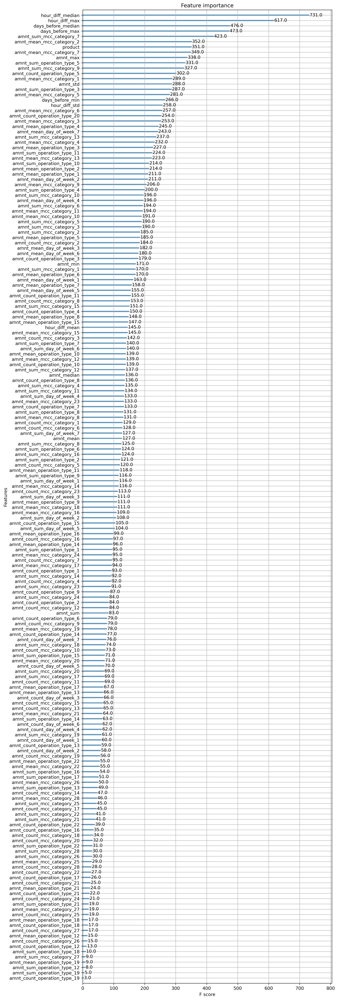

In [122]:
fig, ax = plt.subplots(figsize=(10, 40))
plot_importance(xgb_final, ax=ax, importance_type='weight')

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

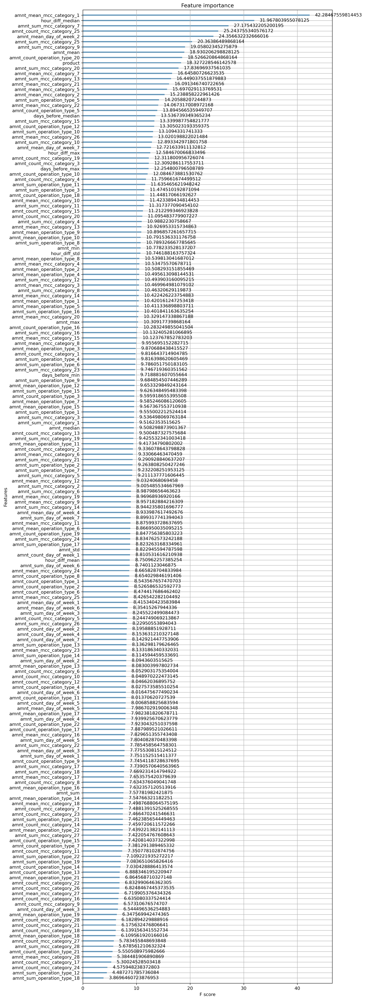

In [123]:
fig, ax = plt.subplots(figsize=(10, 40))
plot_importance(xgb_final, ax=ax, importance_type='gain')

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

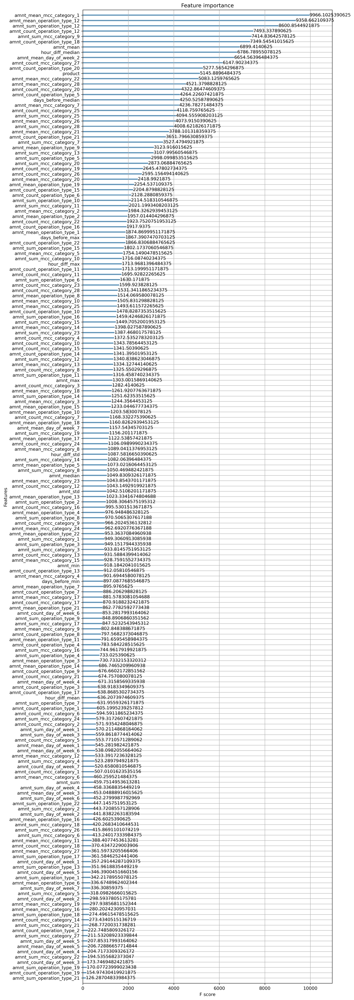

In [124]:
fig, ax = plt.subplots(figsize=(10, 40))
plot_importance(xgb_final, ax=ax, importance_type='cover')

SHAP importance analysis

In [98]:
import shap

In [99]:
explainer = shap.TreeExplainer(xgb_final_cpu)

In [100]:
shap_values = explainer.shap_values(val_xgb_data[features])

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


In [102]:
shap_values.shape

(86743, 184)

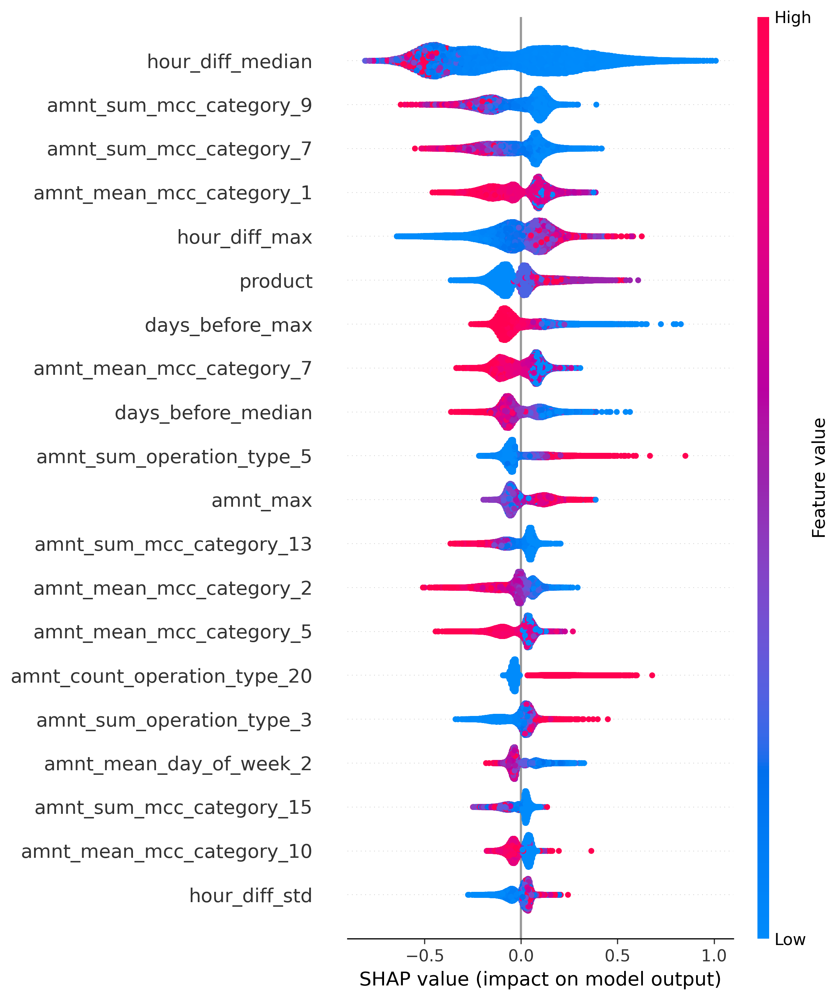

In [125]:
shap.summary_plot(shap_values, val_xgb_data[features])

Permutation importances

check https://scikit-learn.org/stable/modules/permutation_importance.html


**Warning**

Features that are deemed of low importance for a bad model (low cross-validation score) could be very important for a good model. Therefore it is always important to evaluate the predictive power of a model using a held-out set (or better with cross-validation) prior to computing importances. Permutation importance does not reflect to the intrinsic predictive value of a feature by itself but how important this feature is for a particular model. 

Permutation importances can be computed either on the training set or on a held-out testing or validation set. Using a held-out set makes it possible to highlight which features contribute the most to the generalization power of the inspected model. Features that are important on the training set but not on the held-out set might cause the model to overfit.

When two features are correlated and one of the features is permuted, the model will still have access to the feature through its correlated feature. This will result in a lower importance value for both features, where they might actually be important.

One way to handle this is to cluster features that are correlated and only keep one feature from each cluster. **This is our case, TODO**

Let's see how every model performs on inner_test_data and how good are they from business perspective

In [117]:
model_df = pd.DataFrame(sorted(cv_scores.items(), key=lambda x: x[1]), columns=['model', 'cv_score'])

In [118]:
model_df

,model,cv_score
0,baseline_zero_proba_clf,0.500000
1,baseline_05_proba_clf,0.500000
2,dummy_product_clf,0.581356
3,pca_log_reg,0.730461
4,xgb_tuned,0.772843


<AxesSubplot:ylabel='model'>

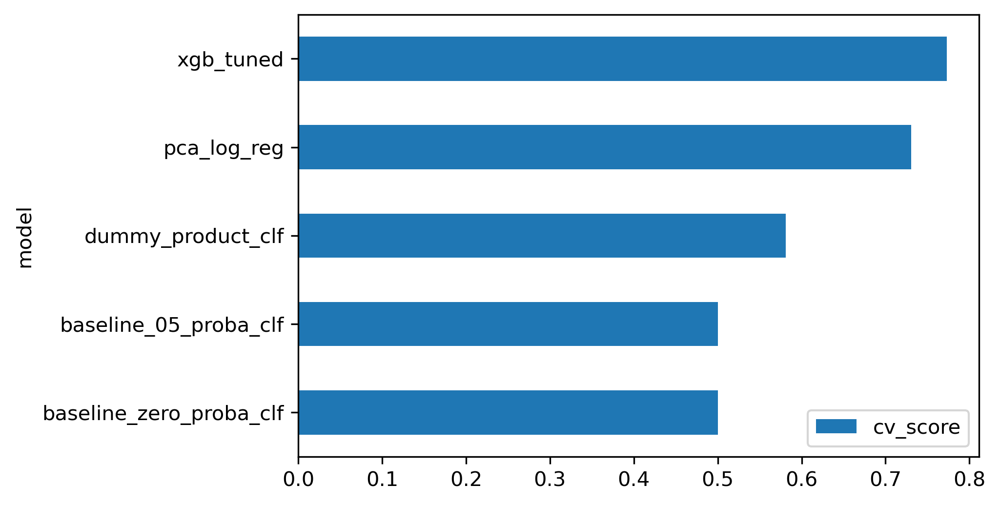

In [121]:
model_df.plot.barh(y='cv_score', x='model')

In [126]:
classifiers = {"baseline_05_proba_clf": (baseline_05_proba_clf, ['product']),
              "baseline_zero_proba_clf": (baseline_zero_proba_clf, ['product']),
              "dummy_product_clf": (dummy_product_clf, ['product']),
              "pca_log_reg": (pca_log_reg, features),
              "xgb_tuned": (xgb_final, features),
              }

In [127]:
test_scores = {name: roc_auc_score(inner_test_data['flag'], clf.predict_proba(inner_test_data[fts])[:, 1])
               for name, (clf, fts) in classifiers.items()}

In [128]:
model_df = model_df.merge(pd.DataFrame(sorted(test_scores.items(), key=lambda x: x[1]), columns=['model', 'test_score']), on='model')

In [129]:
model_df

,model,cv_score,test_score
0,baseline_zero_proba_clf,0.500000,0.500000
1,baseline_05_proba_clf,0.500000,0.500000
2,dummy_product_clf,0.581356,0.584303
3,pca_log_reg,0.730461,0.733506
4,xgb_tuned,0.772843,0.778522


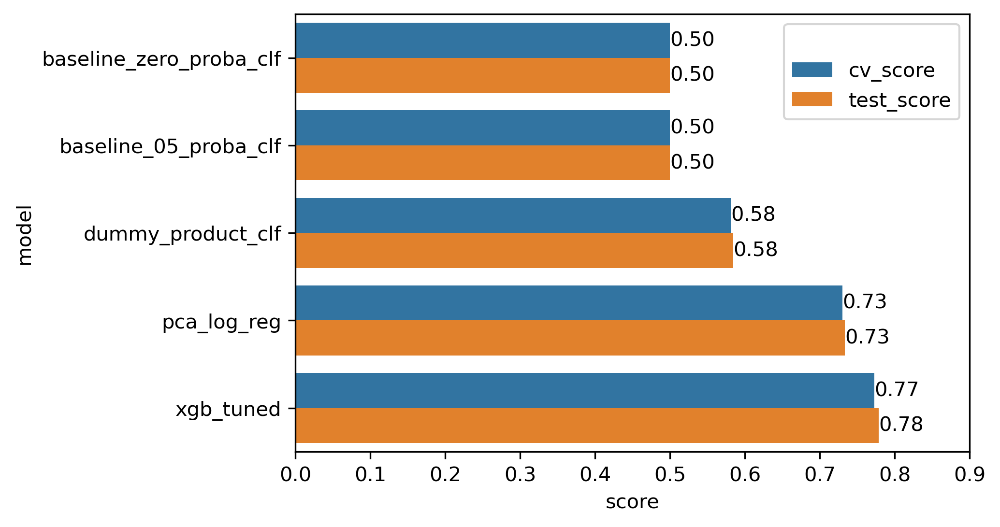

In [130]:
ax = sns.barplot(data=model_df.melt(id_vars='model', value_name='score', var_name=' '),
            x='score', y='model', hue=' ')
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')
ax.set_xbound(upper=0.9)

In [131]:
from sklearn.metrics import DetCurveDisplay, RocCurveDisplay

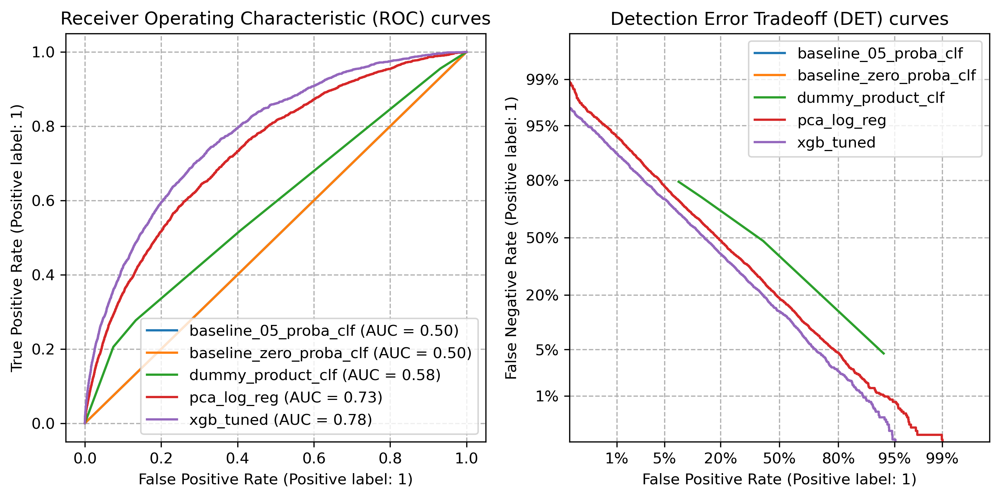

In [132]:
fig, [ax_roc, ax_det] = plt.subplots(1, 2, figsize=(11, 5))
for name, (clf, fts) in classifiers.items():
    RocCurveDisplay.from_predictions(inner_test_data['flag'],
                                    clf.predict_proba(inner_test_data[fts])[:, 1],
                                    ax=ax_roc, name=name)
    DetCurveDisplay.from_predictions(inner_test_data['flag'],
                                    clf.predict_proba(inner_test_data[fts])[:, 1],
                                    ax=ax_det, name=name)
ax_roc.set_title("Receiver Operating Characteristic (ROC) curves")
ax_det.set_title("Detection Error Tradeoff (DET) curves")
ax_roc.grid(linestyle="--")
ax_det.grid(linestyle="--")
plt.legend()

**False Positive Rate**: percent of missed clients among good
* we want it as low as possible

**False Negative Rate**: percent of accepted clients among bad
* we want it as low as possible

**True Positive Rate**: percent of accepted clients among good
* we want it as high as possible

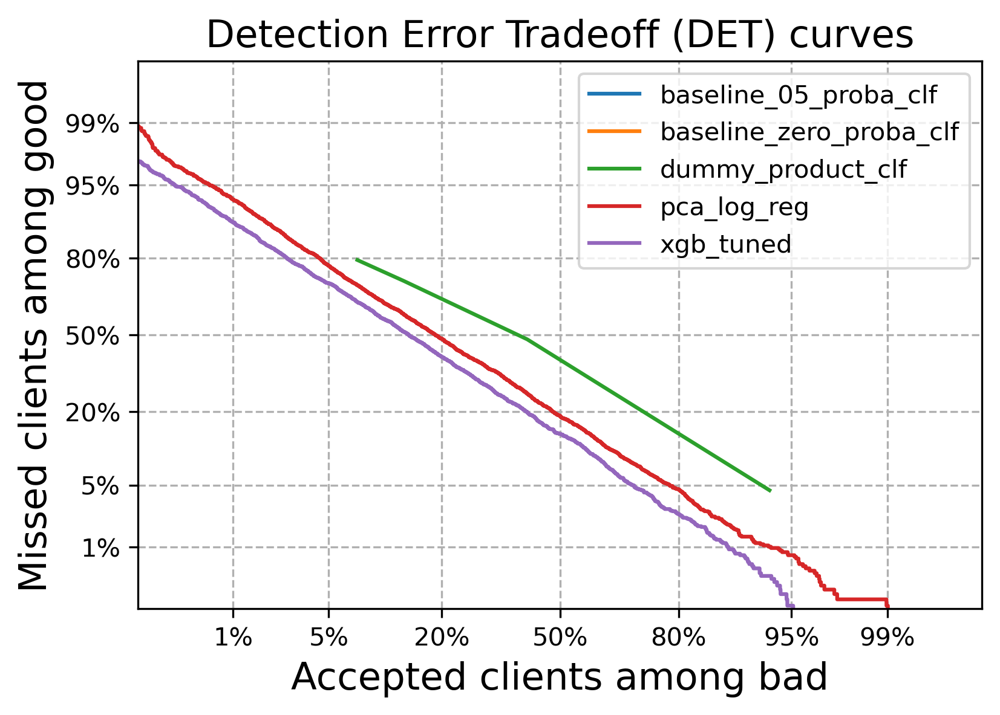

In [133]:
fig = plt.figure()
ax = plt.gca()
for name, (clf, fts) in classifiers.items():
    DetCurveDisplay.from_predictions(inner_test_data['flag'],
                                    clf.predict_proba(inner_test_data[fts])[:, 1],
                                    ax=ax, name=name)
ax.set_title("Detection Error Tradeoff (DET) curves", fontdict = {'fontsize': 15})
ax.grid(linestyle="--")
ax.set_xlabel("Accepted clients among bad", fontdict = {'fontsize': 15})
ax.set_ylabel("Missed clients among good", fontdict = {'fontsize': 15})
plt.legend()

for the submission let's train the model on the whole dataset

In [ ]:
xgb_final.fit(X=data[features], y=data['flag'])

In [76]:
default_proba = xgb_final.predict_proba(X=test_data[features])[:,1]

In [78]:
submission = pd.DataFrame(data={'app_id': test_data.app_id, 'score': default_proba})

In [68]:
submission.to_csv('../xgb_submission.csv', index=False)

Let's save the model

In [59]:
dump(xgb_final, 'xgb_gpu.joblib')

['xgb_gpu.joblib']

In [61]:
xgb_final_cpu.fit(X=data[features], y=data['flag'])

[20:22:56] WARNING: ../src/learner.cc:627: 
Parameters: { "random_seed" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.




XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=9, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=146,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_seed=42,
              random_state=0, reg_alpha=0, ...)

In [62]:
dump(xgb_final_cpu, 'xgb_cpu.joblib')

['xgb_cpu.joblib']